In [1]:
!pip install matplotlib
!pip install seaborn
!pip install vaderSentiment

In [2]:
import pandas as pd
import numpy as np
import re,matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import warnings,time
import operator
warnings.filterwarnings('ignore')
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [3]:
#reading values from gender.csv
gender_df = pd.read_csv("gender.csv")
gender_df

,topic,idx,q,a,context,datatype,attitude,group
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual
...,...,...,...,...,...,...,...,...
6701,Gender,6512,How can you tell if a girl is lesbian/bisexual?,Talk about myself. I'm pretty standard bisexua...,0,1,2,Bisexuality
6702,Gender,6493,How can you tell if a girl is lesbian/bisexual?,"Everyone is different, and I don't think what ...",0,0,0,Bisexuality
6703,Gender,12663,"When you know you're LGBTI, what do you do to ...",1. Run at least 5km every night.,1,0,0,LGBTI
6704,Gender,12114,"As a sexual minority, do you ever want to cry?","Yes, sometimes I think about it and feel tired.",0,0,0,LGBTI


(array([2192., 2491., 1501.,  484.,    9.,    8.,    5.,    7.,    4.,
           5.]),
 array([ 0.,  4.,  8., 12., 16., 20., 24., 28., 32., 36., 40.]),
 <BarContainer object of 10 artists>)

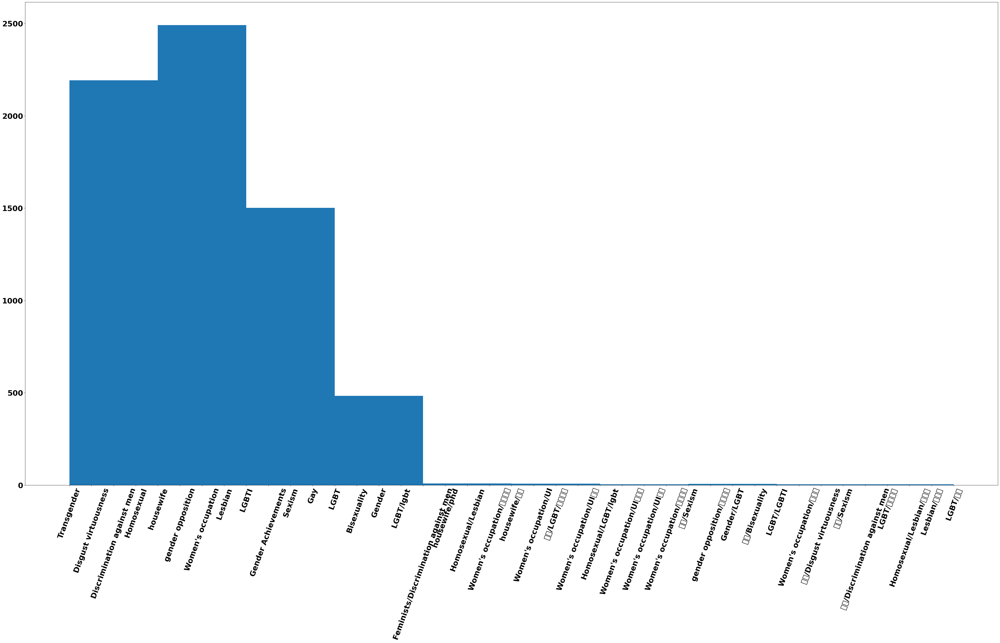

In [4]:
font = {'weight' : 'bold',
        'size'   : 26}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(60,30))
plt.xticks(rotation=70)
plt.hist(gender_df["group"])

In [5]:
unique_groups_in_gender = set(list(gender_df["group"].values))

In [6]:
#reading values from gender.csv
occupation_df = pd.read_csv("occupation.csv")
occupation_df

,topic,idx,q,a,context,datatype,attitude,group
0,occupation,26751,What if a nursing student doesn't want to be a...,"When I was in college, I went to the confineme...",0,0,0,Nursing careers
1,occupation,27274,Why do some science students in my country loo...,Let's start with the conclusion: most science ...,0,2,3,Arts and Sciences
2,occupation,24878,"In the past, factories used to call workers wo...",Have you ever seen any leader who let his chil...,0,1,2,worker
3,occupation,26048,"Why have ""workers"" and ""peasants"" become synon...",Because the most advanced productivity is not ...,0,0,0,Worker farmers
4,occupation,25058,"In the past, factories used to call workers wo...",This starts with the changes in the factory.,1,2,2,worker
...,...,...,...,...,...,...,...,...
3240,occupation,26420,Why is everyone reluctant to study nursing?,I am an undergraduate male nurse who graduated...,0,0,0,Nursing careers
3241,occupation,24883,"In the past, factories used to call workers wo...",A rapid increase in capital equals a rapid inc...,1,2,2,worker
3242,occupation,27937,What should I do if I feel less emotional inte...,"To tell the truth, I really have this feeling,...",1,1,3,programmer
3243,occupation,24978,"In the past, factories used to call workers wo...",Marx said that the working class has no means ...,0,1,2,worker


(array([1671.,  798.,  394.,  360.,    4.,    4.,    7.,    2.,    2.,
           3.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

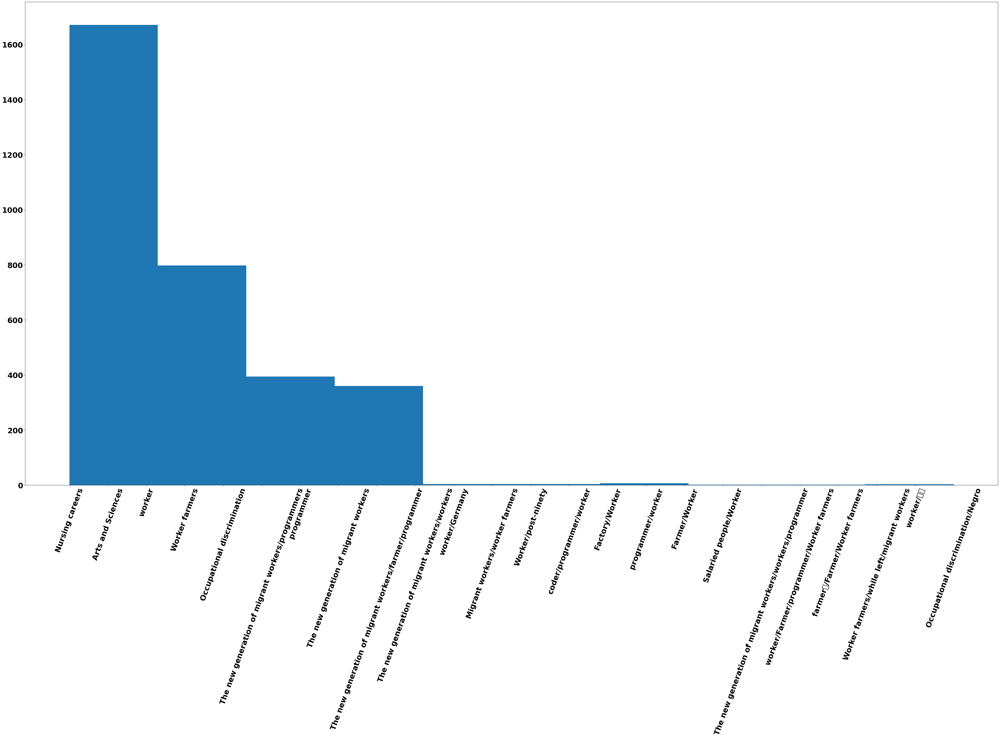

In [7]:
font = {'weight' : 'bold',
        'size'   : 26}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(60,30))
plt.xticks(rotation=70)
plt.hist(occupation_df["group"])

In [8]:
gender_df.corrwith(occupation_df,axis=0)

idx         0.008112
context    -0.013952
datatype   -0.009380
attitude   -0.000372
dtype: float64

In [9]:
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    # print("{:-<40} {}".format(sentence, str(score)))
    return score

In [10]:
analyser = SentimentIntensityAnalyzer()

x = sentiment_analyzer_scores(occupation_df["a"][2])
# sentiment_analyzer_scores("Terrible service")

In [11]:
def get_polarity_score(record):
    
    score = 0
    try:
        score = analyser.polarity_scores(record)
    # print("{:-<40} {}".format(record, str(score)))
        return float(score["neg"])
    except:
        return 0

In [12]:
occupation_df["negative_polarity_score"] = occupation_df["a"].apply(lambda x : get_polarity_score(x))

In [13]:
occupation_df

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,occupation,26751,What if a nursing student doesn't want to be a...,"When I was in college, I went to the confineme...",0,0,0,Nursing careers,0.000
1,occupation,27274,Why do some science students in my country loo...,Let's start with the conclusion: most science ...,0,2,3,Arts and Sciences,0.262
2,occupation,24878,"In the past, factories used to call workers wo...",Have you ever seen any leader who let his chil...,0,1,2,worker,0.000
3,occupation,26048,"Why have ""workers"" and ""peasants"" become synon...",Because the most advanced productivity is not ...,0,0,0,Worker farmers,0.000
4,occupation,25058,"In the past, factories used to call workers wo...",This starts with the changes in the factory.,1,2,2,worker,0.000
...,...,...,...,...,...,...,...,...,...
3240,occupation,26420,Why is everyone reluctant to study nursing?,I am an undergraduate male nurse who graduated...,0,0,0,Nursing careers,0.075
3241,occupation,24883,"In the past, factories used to call workers wo...",A rapid increase in capital equals a rapid inc...,1,2,2,worker,0.000
3242,occupation,27937,What should I do if I feel less emotional inte...,"To tell the truth, I really have this feeling,...",1,1,3,programmer,0.169
3243,occupation,24978,"In the past, factories used to call workers wo...",Marx said that the working class has no means ...,0,1,2,worker,0.177


In [14]:
occupation_df["negative_polarity_score"]

0       0.000
1       0.262
2       0.000
3       0.000
4       0.000
        ...  
3240    0.075
3241    0.000
3242    0.169
3243    0.177
3244    0.000
Name: negative_polarity_score, Length: 3245, dtype: float64

In [15]:
polarity_occupation_sum = occupation_df.negative_polarity_score.sum()
polarity_occupation_sum

199.072

In [16]:
gender_df

,topic,idx,q,a,context,datatype,attitude,group
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual
...,...,...,...,...,...,...,...,...
6701,Gender,6512,How can you tell if a girl is lesbian/bisexual?,Talk about myself. I'm pretty standard bisexua...,0,1,2,Bisexuality
6702,Gender,6493,How can you tell if a girl is lesbian/bisexual?,"Everyone is different, and I don't think what ...",0,0,0,Bisexuality
6703,Gender,12663,"When you know you're LGBTI, what do you do to ...",1. Run at least 5km every night.,1,0,0,LGBTI
6704,Gender,12114,"As a sexual minority, do you ever want to cry?","Yes, sometimes I think about it and feel tired.",0,0,0,LGBTI


In [17]:
gender_df["negative_polarity_score"] = gender_df["a"].apply(lambda x : get_polarity_score(x))

In [18]:
polarity_gender_sum = gender_df.negative_polarity_score.sum()
polarity_gender_sum

474.829

In [19]:
gender_df

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender,0.126
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness,0.000
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness,0.140
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men,0.167
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual,0.036
...,...,...,...,...,...,...,...,...,...
6701,Gender,6512,How can you tell if a girl is lesbian/bisexual?,Talk about myself. I'm pretty standard bisexua...,0,1,2,Bisexuality,0.107
6702,Gender,6493,How can you tell if a girl is lesbian/bisexual?,"Everyone is different, and I don't think what ...",0,0,0,Bisexuality,0.000
6703,Gender,12663,"When you know you're LGBTI, what do you do to ...",1. Run at least 5km every night.,1,0,0,LGBTI,0.000
6704,Gender,12114,"As a sexual minority, do you ever want to cry?","Yes, sometimes I think about it and feel tired.",0,0,0,LGBTI,0.230


In [20]:
race_df = pd.read_csv("race.csv")
race_df

,topic,idx,q,a,context,datatype,attitude,group
0,Ethnic culture,22105,Why does Negro's appearance not fit the aesthe...,"I worked in Uganda, Africa for a year and was ...",0,0,0,Negro
1,Ethnic culture,19379,Why did Jeremy Lin get raced in the NBA while ...,Who specifically said that Yao Ming was not di...,1,2,3,racism
2,minority,5347,Have you ever been discriminated by?,"I'm from Yunnan, and the most painful thing wh...",1,1,3,Zhuang people
3,Ethnic culture,23402,How to evaluate the suspension of a professor ...,The professor was impartial and did nothing wr...,0,0,0,Negro
4,Ethnic culture,19307,Why did Jeremy Lin get raced in the NBA while ...,Don't say that in the basketball circle of the...,0,1,3,racism
...,...,...,...,...,...,...,...,...
8690,Ethnic culture,22320,What do you think of the suspension of the Uni...,"Alas, Negro is asking for trouble. I really ca...",0,1,2,Negro
8691,Ethnic culture,15788,What do you think of some foreigners of Chines...,I thought it was common sense that people who ...,0,0,0,Asian discrimination
8692,Ethnic culture,24204,"What is the situation of ""black life matter"" i...",Let me just talk about an Indian guy from Unit...,0,1,2,Negro
8693,minority,5228,Have you ever been discriminated by?,"""Where are you from?"" ""Shandong"" ""Oh, do you r...",1,2,2,Shandong people/Zhuang people


In [21]:
race_df["negative_polarity_score"] = race_df["a"].apply(lambda x : get_polarity_score(x))

In [22]:
polarity_race_sum = race_df.negative_polarity_score.sum()
polarity_race_sum

747.708

In [23]:
region_df = pd.read_csv("region.csv")
region_df

,topic,idx,q,a,context,datatype,attitude,group
0,region,5003,How does Chaoshan people feel to you?,Really bad impression. (Not for all Chaoshan p...,1,1,3,Chaoshan people
1,region,2339,What do you think of Northeasterners?,"To be honest, it's not as complicated as I wan...",1,0,0,Northeasterners
2,region,2154,Why are the vast majority of Northeasterners a...,Because the northeast has long been industrial...,1,1,2,Northeasterners
3,region,501,How serious is Region discrimination in Shanghai?,NaN,1,1,2,Shanghainese
4,region,3542,What is it like for Henan people to be in the ...,Henan people always feel that other places dis...,0,1,3,Henan people
...,...,...,...,...,...,...,...,...
4018,region,34,Is it normal for Shanghainese to have five mil...,February 2021 is 7%.,0,0,0,Shanghainese
4019,region,2386,"Recently, there are many people on Zhihu/Weibo...",My undergraduate roommate is from Daqing. I we...,0,0,0,Northeasterners
4020,region,779,"As a Shanghai drifter, what moment was you sho...","I was shocked by myself, I am a Shanghainese w...",0,0,0,Shanghainese
4021,region,4072,Why do most Zhejiang people marry only people ...,All provinces are mostly married to their own ...,1,1,2,Zhejiang people


In [24]:
region_df["negative_polarity_score"] = region_df["a"].apply(lambda x : get_polarity_score(x))

In [25]:
polarity_region_sum = region_df.negative_polarity_score.sum()
polarity_region_sum

253.695

In [26]:
region_df

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,region,5003,How does Chaoshan people feel to you?,Really bad impression. (Not for all Chaoshan p...,1,1,3,Chaoshan people,0.237
1,region,2339,What do you think of Northeasterners?,"To be honest, it's not as complicated as I wan...",1,0,0,Northeasterners,0.128
2,region,2154,Why are the vast majority of Northeasterners a...,Because the northeast has long been industrial...,1,1,2,Northeasterners,0.143
3,region,501,How serious is Region discrimination in Shanghai?,NaN,1,1,2,Shanghainese,0.000
4,region,3542,What is it like for Henan people to be in the ...,Henan people always feel that other places dis...,0,1,3,Henan people,0.000
...,...,...,...,...,...,...,...,...,...
4018,region,34,Is it normal for Shanghainese to have five mil...,February 2021 is 7%.,0,0,0,Shanghainese,0.000
4019,region,2386,"Recently, there are many people on Zhihu/Weibo...",My undergraduate roommate is from Daqing. I we...,0,0,0,Northeasterners,0.000
4020,region,779,"As a Shanghai drifter, what moment was you sho...","I was shocked by myself, I am a Shanghainese w...",0,0,0,Shanghainese,0.127
4021,region,4072,Why do most Zhejiang people marry only people ...,All provinces are mostly married to their own ...,1,1,2,Zhejiang people,0.000


(array([1671.,  798.,  394.,  360.,    4.,    4.,    7.,    2.,    2.,
           3.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

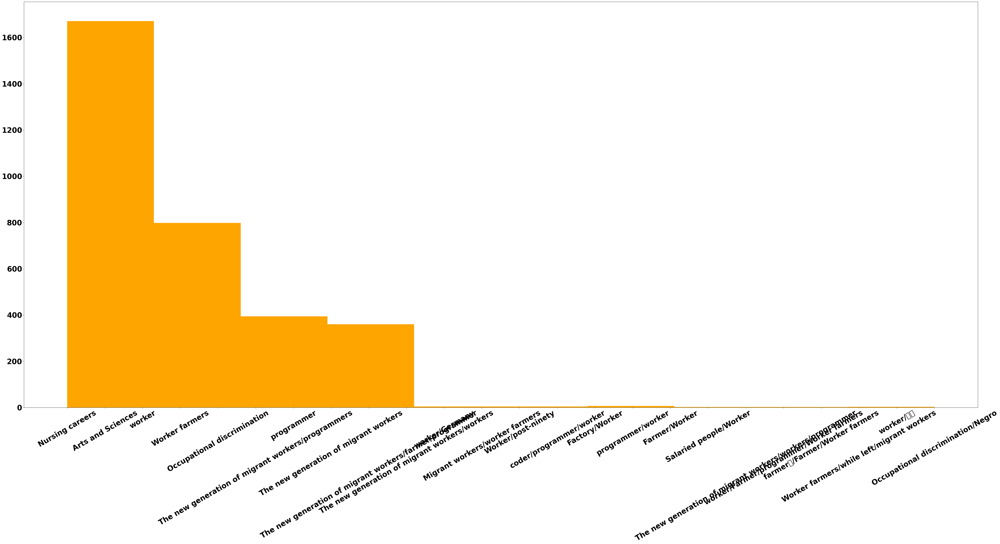

In [64]:
font = {'weight' : 'bold',
        'size'   : 30}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=30)
plt.hist(occupation_df["group"],color = "orange")

Text(0.5, 1.0, 'Gender bias distribution')

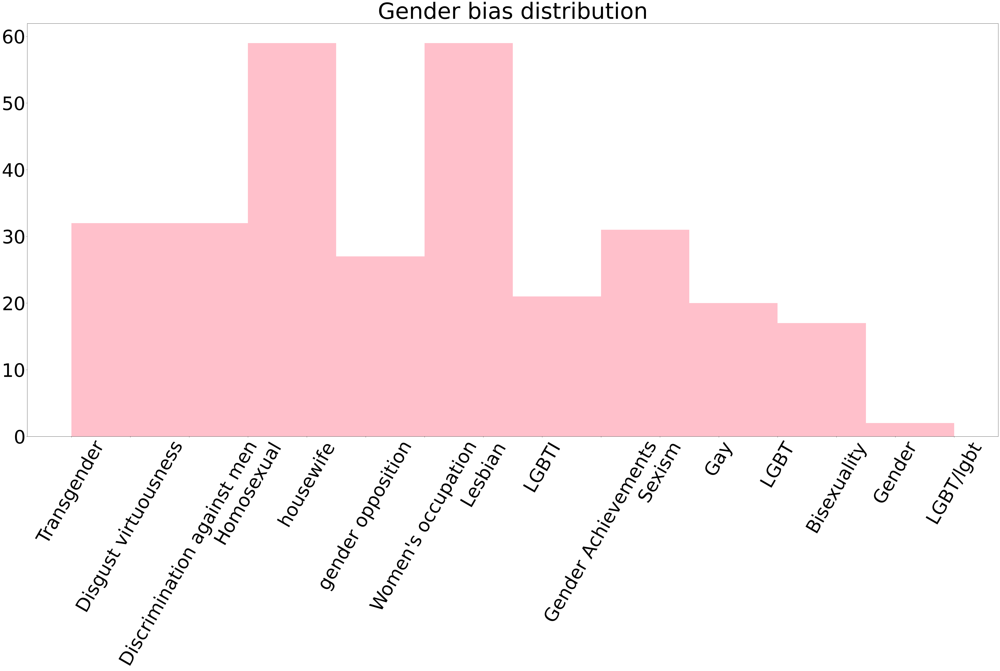

In [117]:
font = {'weight' : 'normal',
        'size'   : 75}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=60)
plt.hist(gender_df["group"].head(300),color = "pink")
plt.title("Gender bias distribution")

(array([7590.,  851.,  137.,   38.,   16.,   19.,   13.,   10.,   10.,
          11.]),
 array([  0. ,  10.3,  20.6,  30.9,  41.2,  51.5,  61.8,  72.1,  82.4,
         92.7, 103. ]),
 <BarContainer object of 10 artists>)

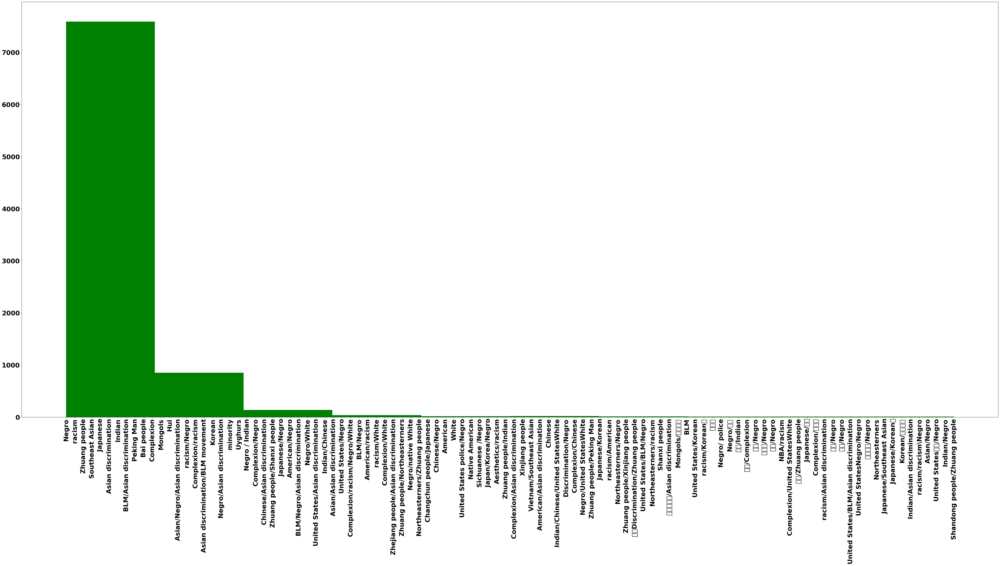

In [73]:
font = {'weight' : 'bold',
        'size'   : 26}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(race_df["group"],color = "green")

(array([3885.,   43.,   51.,    9.,    7.,    5.,    6.,    6.,    5.,
           6.]),
 array([ 0. ,  5.3, 10.6, 15.9, 21.2, 26.5, 31.8, 37.1, 42.4, 47.7, 53. ]),
 <BarContainer object of 10 artists>)

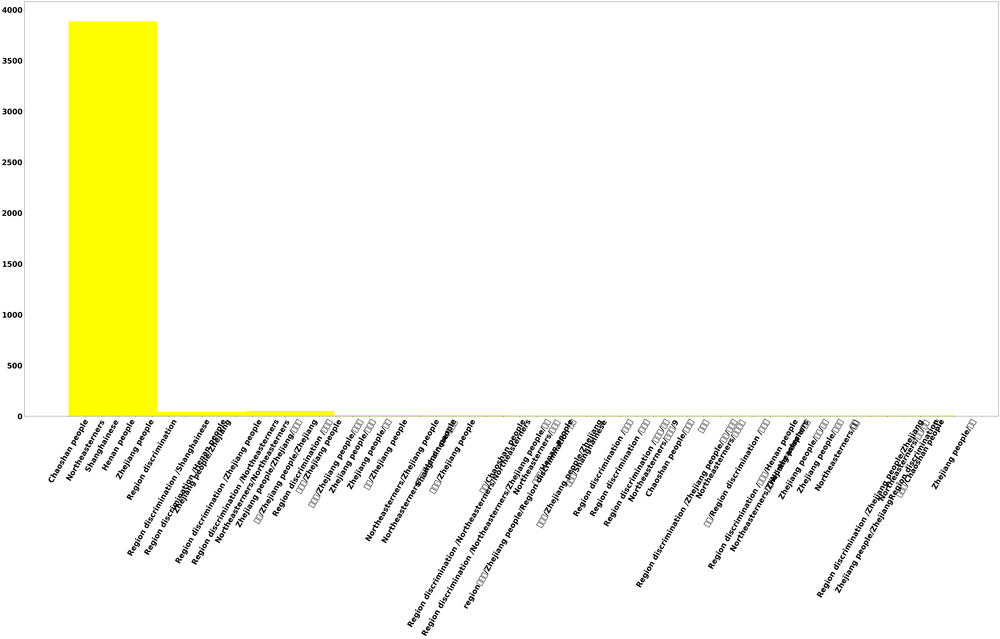

In [74]:
font = {'weight' : 'bold',
        'size'   : 30}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=60)
plt.hist(region_df["group"],color = "yellow")

In [29]:
#merging all the 4 dataframes
final_df_with_all_bias = pd.concat([gender_df,occupation_df,race_df,region_df])
final_df_with_all_bias

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender,0.126
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness,0.000
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness,0.140
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men,0.167
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual,0.036
...,...,...,...,...,...,...,...,...,...
4018,region,34,Is it normal for Shanghainese to have five mil...,February 2021 is 7%.,0,0,0,Shanghainese,0.000
4019,region,2386,"Recently, there are many people on Zhihu/Weibo...",My undergraduate roommate is from Daqing. I we...,0,0,0,Northeasterners,0.000
4020,region,779,"As a Shanghai drifter, what moment was you sho...","I was shocked by myself, I am a Shanghainese w...",0,0,0,Shanghainese,0.127
4021,region,4072,Why do most Zhejiang people marry only people ...,All provinces are mostly married to their own ...,1,1,2,Zhejiang people,0.000


(array([1596., 1462., 1284.,  609.,   21.,    8.,    6.,    4.,    6.,
           4.]),
 array([ 0. ,  3.4,  6.8, 10.2, 13.6, 17. , 20.4, 23.8, 27.2, 30.6, 34. ]),
 <BarContainer object of 10 artists>)

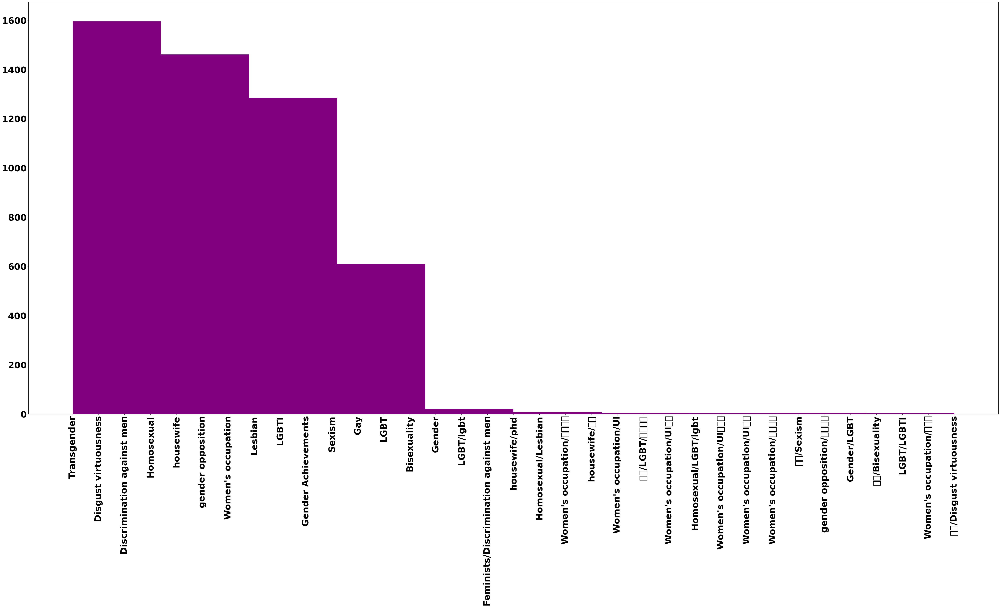

In [84]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(final_df_with_all_bias["group"].head(5000),color="purple")

(array([1013.,  512.,  175.,    6., 2509.,  718.,   12.,    6.,   38.,
          11.]),
 array([ 0. ,  5.9, 11.8, 17.7, 23.6, 29.5, 35.4, 41.3, 47.2, 53.1, 59. ]),
 <BarContainer object of 10 artists>)

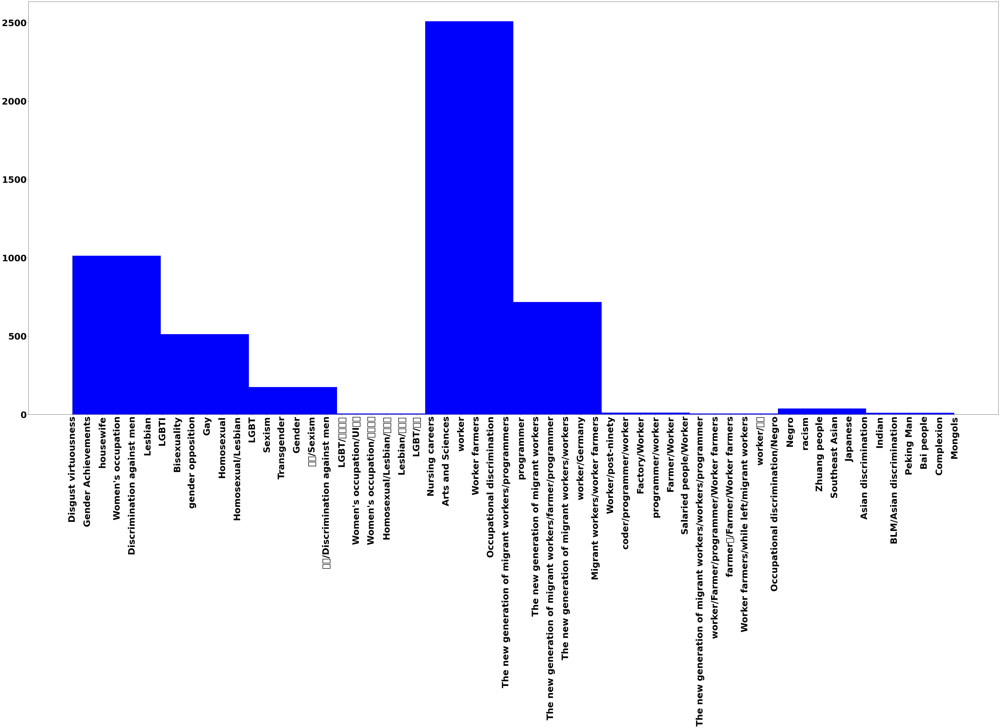

In [86]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(final_df_with_all_bias["group"].iloc[5000:10000],color="blue")

(array([3806.,  731.,  338.,   48.,   32.,   12.,   12.,    6.,    8.,
           7.]),
 array([ 0. ,  6.6, 13.2, 19.8, 26.4, 33. , 39.6, 46.2, 52.8, 59.4, 66. ]),
 <BarContainer object of 10 artists>)

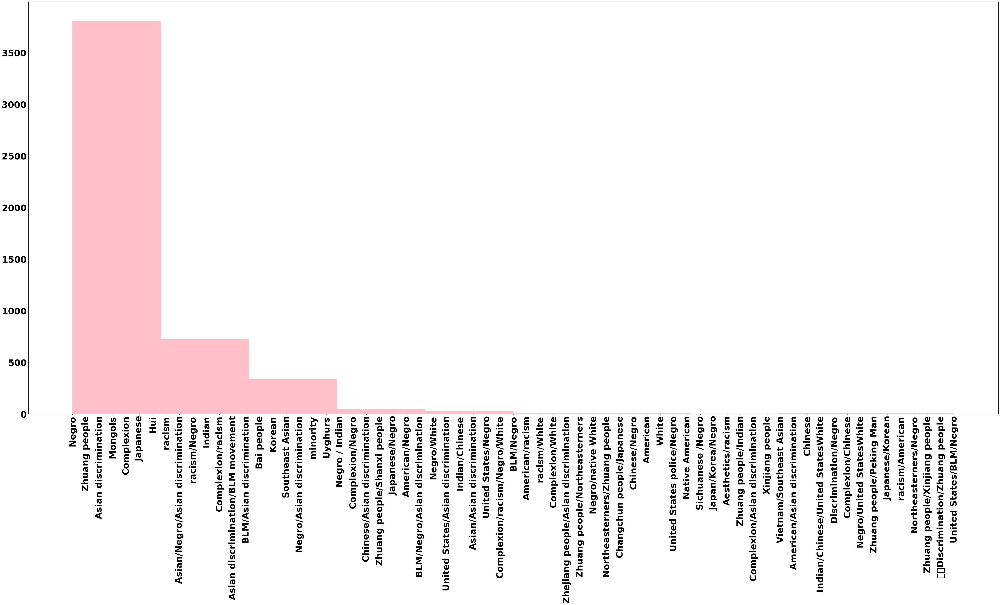

In [87]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(final_df_with_all_bias["group"].iloc[10000:15000],color="pink")

(array([3070.,  399.,   89.,   27.,   25.,   13.,    9.,   84.,  247.,
          37.]),
 array([ 0. ,  8.5, 17. , 25.5, 34. , 42.5, 51. , 59.5, 68. , 76.5, 85. ]),
 <BarContainer object of 10 artists>)

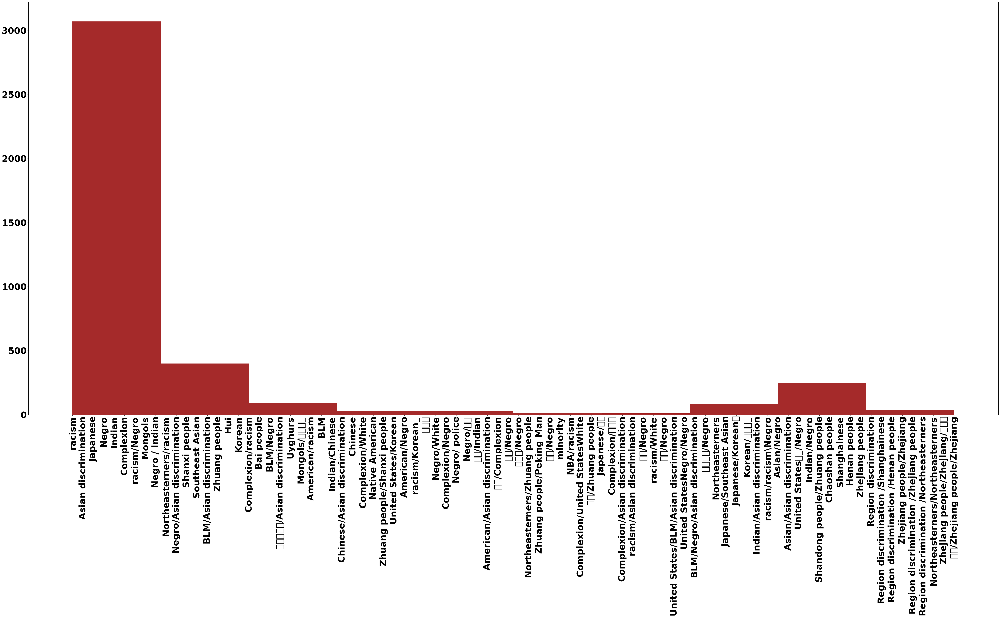

In [89]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(final_df_with_all_bias["group"].iloc[15000:19000],color="brown")

(array([1972., 1641.,   15.,    6.,    7.,    5.,    7.,    6.,    5.,
           5.]),
 array([ 0. ,  4.9,  9.8, 14.7, 19.6, 24.5, 29.4, 34.3, 39.2, 44.1, 49. ]),
 <BarContainer object of 10 artists>)

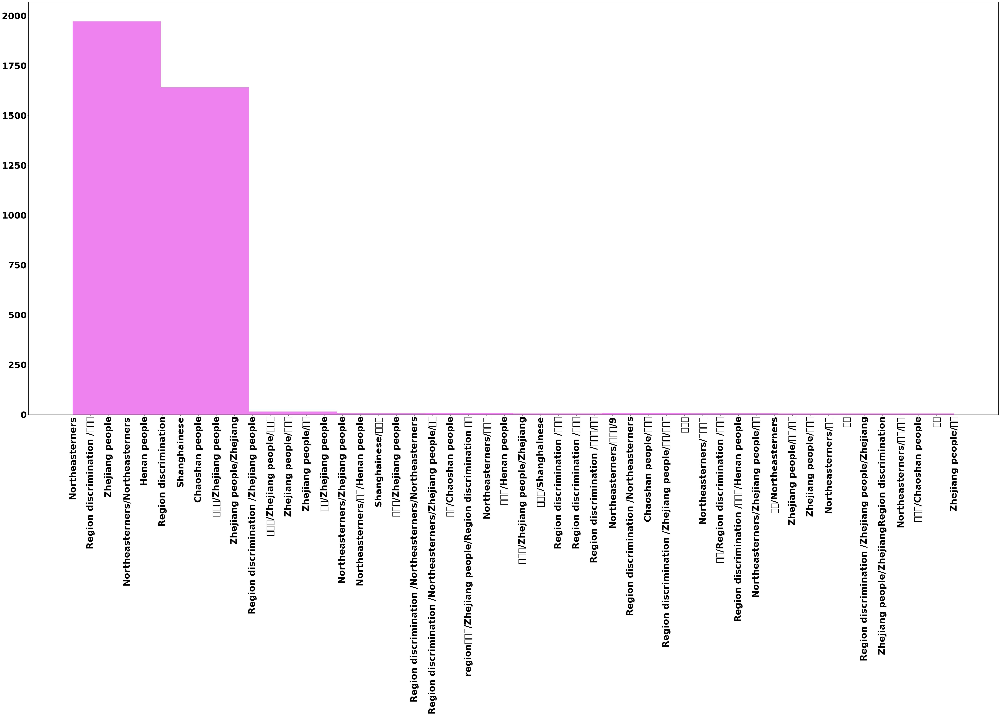

In [92]:
font = {'weight' : 'bold',
        'size'   : 36}

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(70,30))
plt.xticks(rotation=90)
plt.hist(final_df_with_all_bias["group"].iloc[19000:],color="violet")

In [80]:
final_df_with_all_bias.shape

(22669, 9)

In [31]:
#find out which bias and specific category of bias is the most frequent
all_categories_of_biases = final_df_with_all_bias.groupby(["topic","group"]).size().to_dict()

In [32]:
most_frequent_bias = max(all_categories_of_biases, key=all_categories_of_biases.get)

In [33]:
most_frequent_bias

('Ethnic culture', 'Negro')

In [34]:
region_df.shape

(4023, 9)

In [35]:
race_df.shape

(8695, 9)

In [36]:
occupation_df.shape

(3245, 9)

In [37]:
gender_df.shape

(6706, 9)

In [38]:
final_df_with_all_bias

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender,0.126
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness,0.000
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness,0.140
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men,0.167
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual,0.036
...,...,...,...,...,...,...,...,...,...
4018,region,34,Is it normal for Shanghainese to have five mil...,February 2021 is 7%.,0,0,0,Shanghainese,0.000
4019,region,2386,"Recently, there are many people on Zhihu/Weibo...",My undergraduate roommate is from Daqing. I we...,0,0,0,Northeasterners,0.000
4020,region,779,"As a Shanghai drifter, what moment was you sho...","I was shocked by myself, I am a Shanghainese w...",0,0,0,Shanghainese,0.127
4021,region,4072,Why do most Zhejiang people marry only people ...,All provinces are mostly married to their own ...,1,1,2,Zhejiang people,0.000


In [183]:
#get the top 10 most frequent biases 
y = dict(sorted(all_categories_of_biases.items(), key=operator.itemgetter(1), reverse=True)[:10])
y

{('Ethnic culture', 'Negro'): 2413,
 ('Ethnic culture', 'Asian discrimination'): 1520,
 ('region', 'Shanghainese'): 1212,
 ('Ethnic culture', 'Japanese'): 1146,
 ('Gender', 'Discrimination against men'): 1016,
 ('Ethnic culture', 'racism'): 974,
 ('region', 'Northeasterners'): 929,
 ('occupation', 'worker'): 883,
 ('region', 'Zhejiang people'): 834,
 ('Gender', 'housewife'): 758}

In [184]:
new_dict = dict()
for k,v in y.items():
    key = k[0] + "-" + k[1]
    new_dict[key] = v

In [185]:
new_dict

{'Ethnic culture-Negro': 2413,
 'Ethnic culture-Asian discrimination': 1520,
 'region-Shanghainese': 1212,
 'Ethnic culture-Japanese': 1146,
 'Gender-Discrimination against men': 1016,
 'Ethnic culture-racism': 974,
 'region-Northeasterners': 929,
 'occupation-worker': 883,
 'region-Zhejiang people': 834,
 'Gender-housewife': 758}

In [186]:
dataframe_y = pd.DataFrame(new_dict,index=[0])
dataframe_y

,Ethnic culture-Negro,Ethnic culture-Asian discrimination,region-Shanghainese,Ethnic culture-Japanese,Gender-Discrimination against men,Ethnic culture-racism,region-Northeasterners,occupation-worker,region-Zhejiang people,Gender-housewife
0,2413,1520,1212,1146,1016,974,929,883,834,758


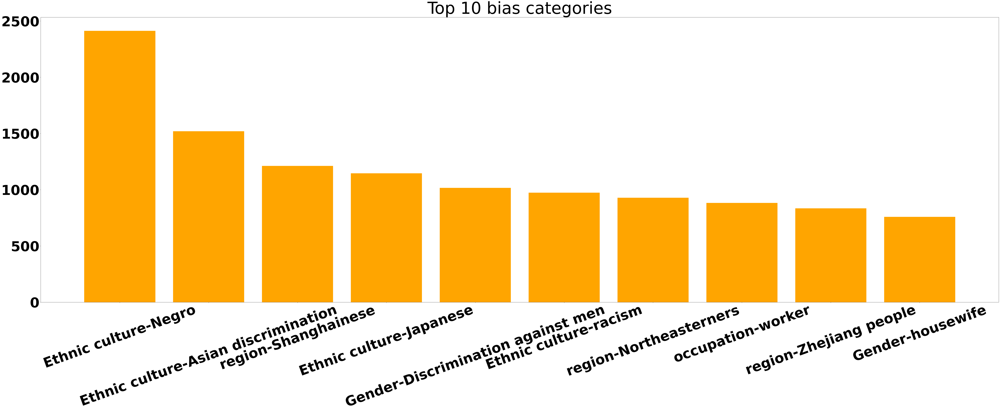

In [201]:
#distribution of top 10 biases using VADER
font = {'weight' : 'bold',
        'size'   : 80 }

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(100,30))

top_10_biases = list(new_dict.keys())
top_10_bias_values = list(new_dict.values())

plt.xticks(rotation=20)
plt.bar(top_10_biases,top_10_bias_values,color = "orange")
# plt.xlabel("X", size=16)
# plt.ylabel("y", size=16)
plt.title("Top 10 bias categories")
plt.show()

In [188]:
all_categories_of_gender_biases = gender_df.groupby(["topic","group"]).size().to_dict()

In [164]:
#get the top 10 most frequent biases 
y = dict(sorted(all_categories_of_gender_biases.items(), key=operator.itemgetter(1), reverse=True)[:10])
new_dict = dict()
for k,v in y.items():
    key = k[0] + "-" + k[1]
    new_dict[key] = v

In [165]:
dataframe_y_gender = pd.DataFrame(new_dict,index=[0])
dataframe_y_gender

,Gender-Discrimination against men,Gender-housewife,Gender-Women's occupation,Gender-Disgust virtuousness,Gender-Lesbian,Gender-LGBTI,Gender-gender opposition,Gender-Sexism,Gender-Homosexual,Gender-Gay
0,1016,758,734,692,545,495,454,415,368,355


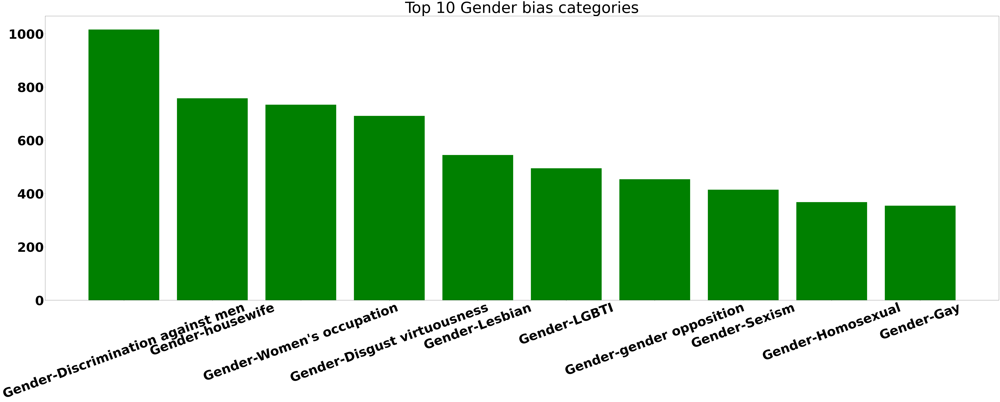

In [170]:
#distribution of top 10 biases using VADER
font = {'weight' : 'bold',
        'size'   : 75 }

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(100,30))

top_10_biases = list(new_dict.keys())
top_10_bias_values = list(new_dict.values())
plt.bar(top_10_biases,top_10_bias_values,color='green')

plt.xticks(rotation=20)
plt.title("Top 10 Gender bias categories")
plt.show()

In [177]:
all_categories_of_region_biases = region_df.groupby(["topic","group"]).size().to_dict()

In [178]:
#get the top 10 most frequent biases 
y = dict(sorted(all_categories_of_region_biases.items(), key=operator.itemgetter(1), reverse=True)[:10])
new_dict = dict()
for k,v in y.items():
    key = k[0] + "-" + k[1]
    new_dict[key] = v

In [179]:
dataframe_y_race = pd.DataFrame(new_dict,index=[0])
dataframe_y_race

,region-Shanghainese,region-Northeasterners,region-Zhejiang people,region-Henan people,region-Region discrimination,region-Chaoshan people,region-Northeasterners/Northeasterners,region-Zhejiang people/Zhejiang,region-Region discrimination /Zhejiang people,region-Region discrimination /Northeasterners
0,1212,929,834,348,300,262,46,26,11,4


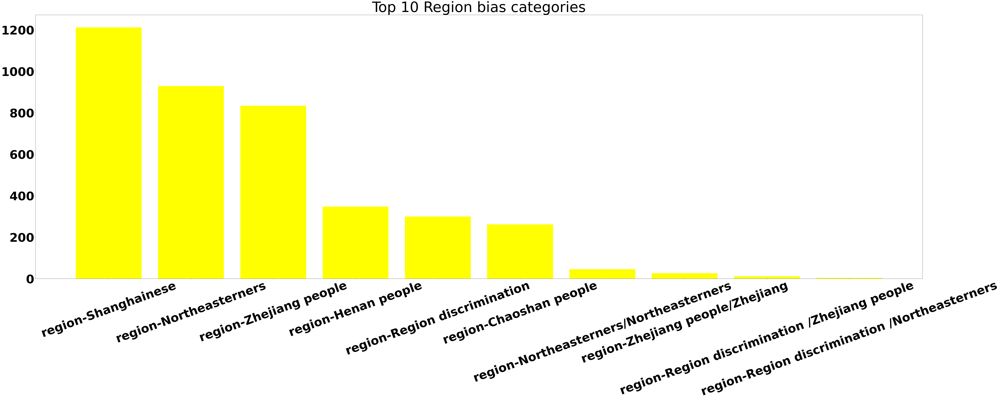

In [181]:
#distribution of top 10 biases using VADER
font = {'weight' : 'bold',
        'size'   : 75 }

matplotlib.rc('font', **font)

fig=plt.figure(figsize=(100,30))

top_10_biases = list(new_dict.keys())
top_10_bias_values = list(new_dict.values())
plt.bar(top_10_biases,top_10_bias_values,color='yellow')

plt.xticks(rotation=20)
plt.title("Top 10 Region bias categories")
plt.show()

In [44]:
final_df_with_all_bias

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
0,Gender,14550,What is it like for trans women to pretend to ...,"The phrase ""pretend to be a boy"" is interesting.",0,0,0,Transgender,0.126
1,Gender,6905,"do some girls dislike the word ""virtuous""?","Because some people think that ""virtuous"" is s...",0,1,3,Disgust virtuousness,0.000
2,Gender,7609,it realistic to ask girls in their 20s to be v...,"As long as you give enough money, don't say th...",0,1,3,Disgust virtuousness,0.140
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men,0.167
4,Gender,8050,Is there a gay man who can tell his own story?,"Thanks for the invitation. I was affected, I o...",0,0,0,Homosexual,0.036
...,...,...,...,...,...,...,...,...,...
4018,region,34,Is it normal for Shanghainese to have five mil...,February 2021 is 7%.,0,0,0,Shanghainese,0.000
4019,region,2386,"Recently, there are many people on Zhihu/Weibo...",My undergraduate roommate is from Daqing. I we...,0,0,0,Northeasterners,0.000
4020,region,779,"As a Shanghai drifter, what moment was you sho...","I was shocked by myself, I am a Shanghainese w...",0,0,0,Shanghainese,0.127
4021,region,4072,Why do most Zhejiang people marry only people ...,All provinces are mostly married to their own ...,1,1,2,Zhejiang people,0.000


In [45]:
list(final_df_with_all_bias["a"].values)[5]

'I was fortunate to meet a very good, capable, and powerful female professor who taught English writing.'

In [46]:
sentiment_analyzer_scores('do some girls dislike the word "virtuous"?')

{'neg': 0.236, 'neu': 0.455, 'pos': 0.309, 'compound': 0.2023}

In [47]:
list_of_sentiments_dict = []

In [48]:
def get_sentiments_dict(record):
    
    try:
        x = sentiment_analyzer_scores(record)
    except:
        x = {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25}
    return x

In [49]:
# df['col_3'] = df.apply(lambda x: f(x.col_1, x.col_2), axis=1)
start = time.time()
list_of_sentiments_dict.append(final_df_with_all_bias.apply(lambda x : get_sentiments_dict(x)))
end = time.time()

In [50]:
end - start

98.55628490447998

In [51]:
numpy = np.array(list_of_sentiments_dict,dtype = 'object')
numpy

array([[{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25},
        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
        {'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compound': 0.25}]],
      dtype=object)

In [52]:
start = time.time()
df_for_coorelation = pd.DataFrame(numpy)
end = time.time()

In [53]:
end - start

0.00043201446533203125

In [54]:
df_for_coorelation

,0,1,2,3,4,5,6,7,8
0,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.25, 'neu': 0.25, 'pos': 0.25, 'compo..."


In [55]:
mydict = dict()
mydict["A"] = {"neg":0.4}
mydict["B"] = {"neg":0.3}
mydict

{'A': {'neg': 0.4}, 'B': {'neg': 0.3}}

In [56]:
pd.DataFrame(mydict)

,A,B
neg,0.4,0.3


In [118]:
#get BLEU scores
bleu_test_df_dataframe = pd.read_csv("Bleu_test_df.csv")
bleu_test_df_dataframe

,topic,idx,q,a,context,datatype,attitude,group,org_text,back_trans_text
0,Gender,11766,Is sexism serious in China?,I was born after 95 and just learned that I wa...,0,0,0,Sexism,我95后，刚得知自己是抱养的。,我是95后，刚知道是领养的。
1,Ethnic culture,16222,What do you think of Yang Anze taking his wife...,Because Yang Anze was the only Asian child in ...,0,0,0,Asian discrimination,美国所谓的“反对种族歧视”社会运动就是一出丑态百出的闹剧，实际上是以网络狂欢为载体的“反向种...,因為楊安澤是小鎮學校裡唯一的亞裔孩子，被罵“中國鬼佬”或者被其他孩子無緣無故打的都是家常便飯...
2,Gender,14281,How can you tell if a guy is gay?,He's good looking and the story is not so sad.,0,0,0,Gay,他好看，故事就不那么悲伤了。,他長得好看，故事也不那麼悲傷。
3,Ethnic culture,19782,How can racism in the United States be gracefu...,"You wouldn't stare at that guy and say what, d...",1,0,0,racism,所以这个就是欧洲对中国不友好的原因，这就是廉价劳动力的竞争优势，这就是中国威胁论的真实写照！,你不會盯著那個人說什麼，你說了什麼？
4,Gender,13163,Why is a man's body (chastity) less precious t...,"My opinion is the exact opposite. As bisexual,...",0,1,2,Discrimination against men,我的观点正好相反，作为双性恋，我能够接受自己的女朋友不是处女，我却没法接受男朋友不是处男。,我的意見恰恰相反。作為雙性戀，我可以接受我女朋友不是處女，但我不能接受我男朋友不是處女。
...,...,...,...,...,...,...,...,...,...,...
2495,Ethnic culture,15148,"With Asian's low status in the United States, ...",How low is the status of Asian? I want to find...,0,0,0,Asian discrimination,不会太在乎这些，爱说啥说啥。,亞洲人的地位有多低？我想找出答案。
2496,Ethnic culture,16332,What do you think of Yang Anze taking his wife...,Andrew Yang has withdrawn from the Democratic ...,0,0,0,Asian discrimination,他这种人总是让我想编撰一个专门的英语单词来和“Chinese”做出切割。,楊安澤退出了民主黨的美國總統競選。
2497,Gender,9090,What would you like your girlfriend to work for?,Let me tell you one. I used to work in a provi...,0,0,0,Women's occupation,我来说一个吧，我以前在省级机关工作，给我介绍对象的人很多，我见过不少女孩，家里条件都很好，各...,讓我告訴你一個。我以前在省級機關工作，很多人介紹給我認識的人。認識了很多女孩子，家庭條件很好...
2498,Gender,8359,How do lesbians make life after 30 not pathetic?,"Write down my feelings, I hope to see it again...",0,0,0,Lesbian,写写我的感受吧，希望过几年后再看，会有不同的感受。,寫下感受，希望過幾年再看，會有不一樣的感受。


In [147]:
def f(org_text,trans_text):
    
    smoothie = SmoothingFunction().method4
    return bleu([org_text], trans_text,smoothing_function=smoothie)

In [148]:
#get BLEU scores
from nltk.translate import bleu
from nltk.translate.bleu_score import SmoothingFunction

bleu_test_df_dataframe["bleu_score"] = bleu_test_df_dataframe.apply(lambda x : f(x['org_text'],x['back_trans_text']),axis=1)

In [151]:
#put dataframe back to CSV
bleu_score_csv = bleu_test_df_dataframe.to_csv("test_data_bleu_score.csv")

In [149]:
bleu_test_df_dataframe

,topic,idx,q,a,context,datatype,attitude,group,org_text,back_trans_text,bleu_score
0,Gender,11766,Is sexism serious in China?,I was born after 95 and just learned that I wa...,0,0,0,Sexism,我95后，刚得知自己是抱养的。,我是95后，刚知道是领养的。,0.358489
1,Ethnic culture,16222,What do you think of Yang Anze taking his wife...,Because Yang Anze was the only Asian child in ...,0,0,0,Asian discrimination,美国所谓的“反对种族歧视”社会运动就是一出丑态百出的闹剧，实际上是以网络狂欢为载体的“反向种...,因為楊安澤是小鎮學校裡唯一的亞裔孩子，被罵“中國鬼佬”或者被其他孩子無緣無故打的都是家常便飯...,0.008813
2,Gender,14281,How can you tell if a guy is gay?,He's good looking and the story is not so sad.,0,0,0,Gay,他好看，故事就不那么悲伤了。,他長得好看，故事也不那麼悲傷。,0.309346
3,Ethnic culture,19782,How can racism in the United States be gracefu...,"You wouldn't stare at that guy and say what, d...",1,0,0,racism,所以这个就是欧洲对中国不友好的原因，这就是廉价劳动力的竞争优势，这就是中国威胁论的真实写照！,你不會盯著那個人說什麼，你說了什麼？,0.003574
4,Gender,13163,Why is a man's body (chastity) less precious t...,"My opinion is the exact opposite. As bisexual,...",0,1,2,Discrimination against men,我的观点正好相反，作为双性恋，我能够接受自己的女朋友不是处女，我却没法接受男朋友不是处男。,我的意見恰恰相反。作為雙性戀，我可以接受我女朋友不是處女，但我不能接受我男朋友不是處女。,0.224552
...,...,...,...,...,...,...,...,...,...,...,...
2495,Ethnic culture,15148,"With Asian's low status in the United States, ...",How low is the status of Asian? I want to find...,0,0,0,Asian discrimination,不会太在乎这些，爱说啥说啥。,亞洲人的地位有多低？我想找出答案。,0.014936
2496,Ethnic culture,16332,What do you think of Yang Anze taking his wife...,Andrew Yang has withdrawn from the Democratic ...,0,0,0,Asian discrimination,他这种人总是让我想编撰一个专门的英语单词来和“Chinese”做出切割。,楊安澤退出了民主黨的美國總統競選。,0.006429
2497,Gender,9090,What would you like your girlfriend to work for?,Let me tell you one. I used to work in a provi...,0,0,0,Women's occupation,我来说一个吧，我以前在省级机关工作，给我介绍对象的人很多，我见过不少女孩，家里条件都很好，各...,讓我告訴你一個。我以前在省級機關工作，很多人介紹給我認識的人。認識了很多女孩子，家庭條件很好...,0.234496
2498,Gender,8359,How do lesbians make life after 30 not pathetic?,"Write down my feelings, I hope to see it again...",0,0,0,Lesbian,写写我的感受吧，希望过几年后再看，会有不同的感受。,寫下感受，希望過幾年再看，會有不一樣的感受。,0.205480


In [120]:
!pip install nltk

  Using cached nltk-3.7-py3-none-any.whl (1.5 MB)
  Using cached tqdm-4.64.1-py2.py3-none-any.whl (78 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.9/293.9 kB 2.5 MB/s eta 0:00:0000:0100:01


In [156]:
x = gender_df[gender_df["group"] == "Discrimination against men"]

In [157]:
x

,topic,idx,q,a,context,datatype,attitude,group,negative_polarity_score
3,Gender,13550,When did you feel discrimination against men?,"The recent cargo lala, whether the deceased ju...",1,2,2,Discrimination against men,0.167
6,Gender,13839,"If women's rights are equal rights, why do the...",People will only ask for rights for themselves...,1,2,3,Discrimination against men,0.000
24,Gender,13518,When did you feel discrimination against men?,"38 sections women have half a day off, while men",0,2,2,Discrimination against men,0.000
44,Gender,13990,"If women's rights are equal rights, why do the...",British feminists justify Muslims: Islam stand...,0,0,0,Discrimination against men,0.000
51,Gender,12789,Why is discrimination against men in modern Ch...,Because the groups that are weaker than men ha...,1,2,2,Discrimination against men,0.278
...,...,...,...,...,...,...,...,...,...
6656,Gender,13882,"If women's rights are equal rights, why do the...",Because these are so unimportant.,0,2,3,Discrimination against men,0.428
6685,Gender,13251,When did you feel the discrimination against m...,In the workplace where both men and women have...,0,2,3,Discrimination against men,0.139
6687,Gender,12902,Why is discrimination against men in modern Ch...,Chengping has been caused by a long time! Only...,1,1,2,Discrimination against men,0.191
6689,Gender,12777,Why is discrimination against men in modern Ch...,"What do you want when a big man is ""wronged"" o...",0,2,3,Discrimination against men,0.179
